# Classifying Urban sounds using Deep Learning

## 1 Data Exploration and Visualisation

### UrbanSound dataset

For this project we will use a dataset called Urbansound8K. The dataset contains 8732 sound excerpts (<=4s) of urban sounds from 10 classes, which are:

- Air Conditioner
- Car Horn
- Children Playing
- Dog bark
- Drilling
- Engine Idling
- Gun Shot
- Jackhammer
- Siren
- Street Music

The accompanying metadata contains a unique ID for each sound excerpt along with it's given class name.

A sample of this dataset is included with the accompanying git repo and the full dataset can be downloaded from [here](https://urbansounddataset.weebly.com/urbansound8k.html).

### Audio sample file data overview

These sound excerpts are digital audio files in .wav format. 

Sound waves are digitised by sampling them at discrete intervals known as the sampling rate (typically 44.1kHz for CD quality audio meaning samples are taken 44,100 times per second). 

Each sample is the amplitude of the wave at a particular time interval, where the bit depth determines how detailed the sample will be also known as the dynamic range of the signal (typically 16bit which means a sample can range from 65,536 amplitude values). 

This can be represented with the following image: 
<img src="https://i.imgur.com/PJeiFdy.png">

Therefore, the data we will be analysing for each sound excerpts is essentially a one dimensional array or vector of amplitude values. 

### Analysing audio data 

For audio analysis, we will be using the following libraries: 

#### 1. IPython.display.Audio 

This allows us to play audio directly in the Jupyter Notebook. 

#### 2. Librosa 

librosa is a Python package for music and audio processing by Brian McFee and will allow us to load audio in our notebook as a numpy array for analysis and manipulation. 

You may need to install librosa using pip as follows: 

`pip install librosa` 

### Auditory inspection 

We will use `IPython.display.Audio` to play the audio files so we can inspect aurally. 

In [ ]:
import IPython.display as ipd

ipd.Audio('/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/audio/fold1/14113-4-0-0.wav')

### Visual inspection

We will load a sample from each class and visually inspect the data for any patterns. We will use librosa to load the audio file into an array then librosa.display and matplotlib to display the waveform. 

In [2]:
# Load imports

import IPython.display as ipd
import librosa
import librosa.display
from scipy.io import wavfile as wav
import matplotlib.pyplot as plt

import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.optimizers import Adam
from keras.utils import np_utils
from sklearn import metrics

from keras.callbacks import ModelCheckpoint 
from datetime import datetime 

from keras.layers import Convolution2D, Conv2D, MaxPooling2D, GlobalAveragePooling2D

import warnings
warnings.filterwarnings('ignore')

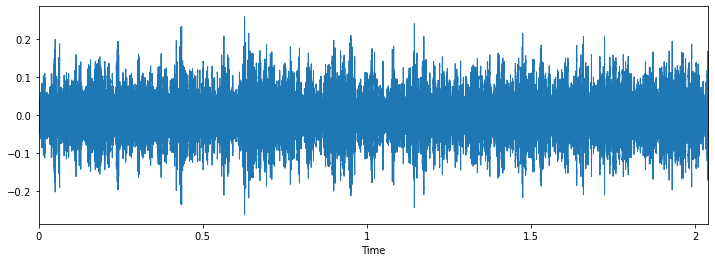

In [3]:
# Class: Air Conditioner

filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/audio/fold1/127873-0-0-0.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

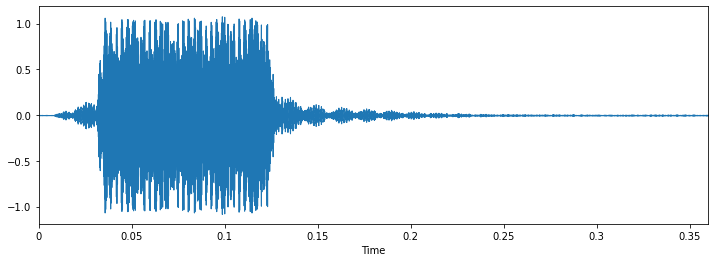

In [4]:
# Class: Car horn 

filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/audio/fold1/162540-1-0-0.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

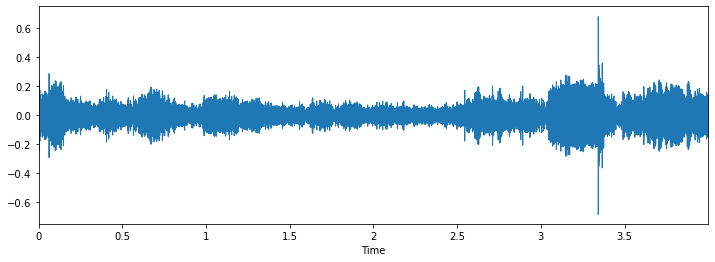

In [5]:
# Class: Children playing 

filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/audio/fold1/105415-2-0-1.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

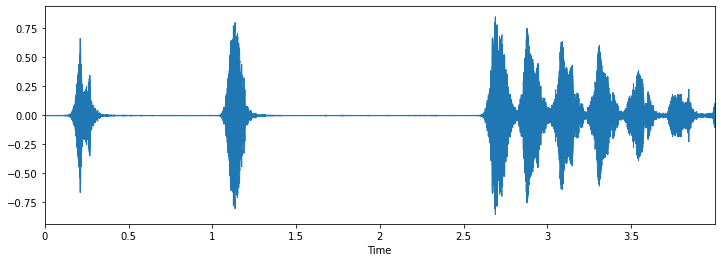

In [6]:
# Class: dog bark

filename = filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/audio/fold1/101415-3-0-2.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

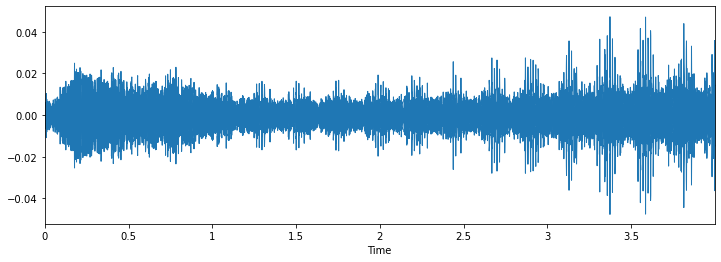

In [7]:
# Class: drilling

filename = filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/audio/fold1/14113-4-0-0.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

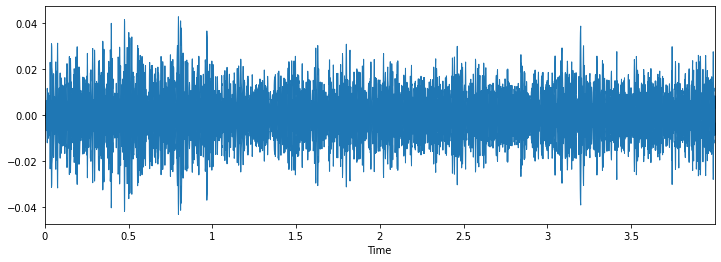

In [8]:
# Class: engine

filename = filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/audio/fold1/103258-5-0-0.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

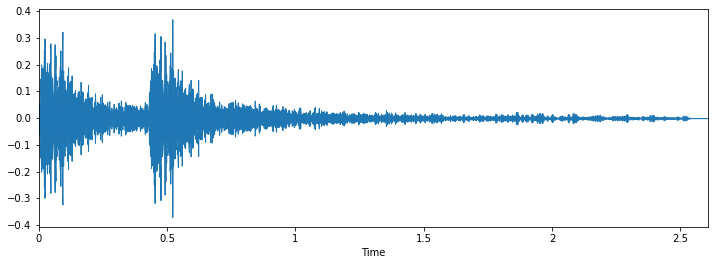

In [9]:
# Class: gun shot

filename = filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/audio/fold1/102305-6-0-0.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

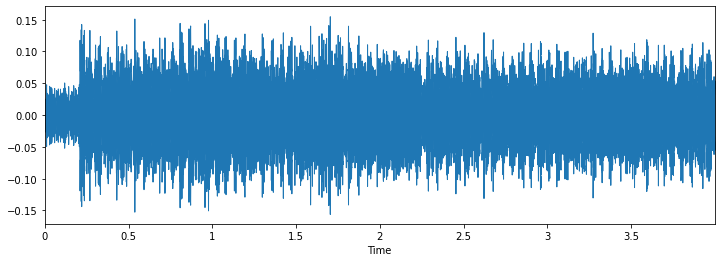

In [10]:
# Class: jackhammer

filename = filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/audio/fold1/103074-7-0-0.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

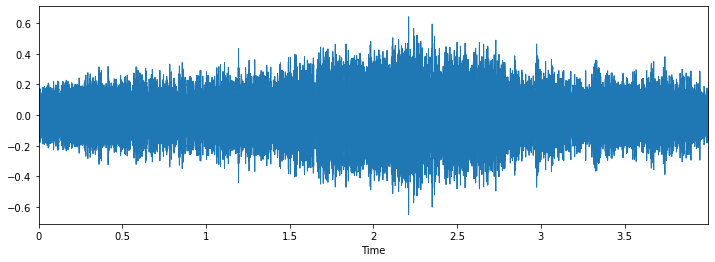

In [11]:
# Class: siren

filename = filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/audio/fold1/106905-8-0-0.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

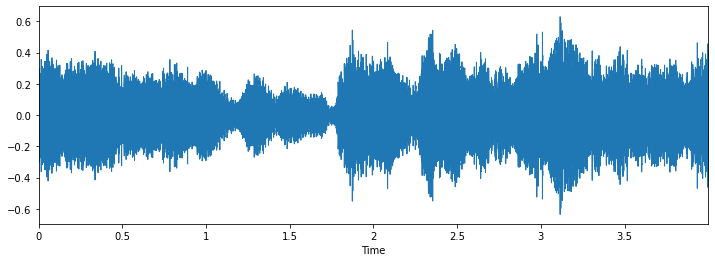

In [12]:
# Class: street music

filename = filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/audio/fold1/108041-9-0-11.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

#### Extracting a MFCC

For this we will use [Librosa's mfcc() function](https://librosa.github.io/librosa/generated/librosa.feature.mfcc.html) which generates an MFCC(Mel-frequency cepstral coefficients ) from time series audio data. 

Original sample rate: 48000
Librosa sample rate: 22050


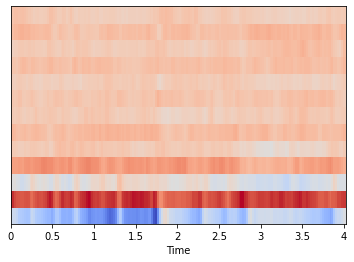

In [13]:
filename = filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/audio/fold1/108041-9-0-11.wav'

librosa_audio, librosa_sample_rate = librosa.load(filename) 
scipy_sample_rate, scipy_audio = wav.read(filename) 

melspec = librosa.feature.melspectrogram(y=librosa_audio, sr=librosa_sample_rate)
mfccs = librosa.feature.mfcc(y=librosa_audio, sr=librosa_sample_rate, n_mfcc=13) 

print('Original sample rate:', scipy_sample_rate) 
print('Librosa sample rate:', librosa_sample_rate) 

librosa.display.specshow(mfccs, sr=librosa_sample_rate, x_axis='time')

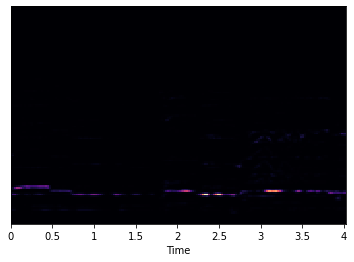

In [14]:
librosa.display.specshow(melspec, sr=librosa_sample_rate, x_axis='time')

### Dataset Metadata 

Here we will load the UrbanSound metadata .csv file into a Panda dataframe. 

In [15]:
import pandas as pd

metadata = pd.read_csv('/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/metadata/UrbanSound8K1.csv',sep=';')

metadata.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.5,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.5,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.0,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.5,1,5,2,children_playing


### Class distributions

In [16]:
print(metadata['class'].value_counts())

air_conditioner     1000
jackhammer          1000
children_playing    1000
street_music        1000
drilling             999
dog_bark             999
engine_idling        998
siren                929
car_horn             429
gun_shot             373
Name: class, dtype: int64


### Observations 

Here we can see the Class labels are unbalanced. Although 7 out of the 10 classes all have exactly 1000 samples, and siren is not far off with 929, the remaining two (car_horn, gun_shot) have significantly less samples at 43% and 37% respectively. 

This will be a concern and something we may need to address later on. 

### Audio sample file properties

Next we will iterate through each of the audio sample files and extract, number of audio channels, sample rate and bit-depth. 

In [17]:
#pip install helpers

import struct

class WavFileHelper():
    
    def read_file_properties(self, filename):

        wave_file = open(filename,"rb")
        
        riff = wave_file.read(12)
        fmt = wave_file.read(36)
        
        num_channels_string = fmt[10:12]
        num_channels = struct.unpack('<H', num_channels_string)[0]

        sample_rate_string = fmt[12:16]
        sample_rate = struct.unpack("<I",sample_rate_string)[0]
        
        bit_depth_string = fmt[22:24]
        bit_depth = struct.unpack("<H",bit_depth_string)[0]

        return (num_channels, sample_rate, bit_depth)

In [18]:
# Load various imports 
import pandas as pd
import os
import librosa
import librosa.display

#from helpers.wavfilehelper import WavFileHelper
wavfilehelper = WavFileHelper()

audiodata = []
for index, row in metadata.iterrows():
    
    file_name = os.path.join(os.path.abspath('/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/audio/'),'fold'+str(row["fold"])+'/',str(row["slice_file_name"]))
    data = wavfilehelper.read_file_properties(file_name)
    audiodata.append(data)

# Convert into a Panda dataframe
audiodf = pd.DataFrame(audiodata, columns=['num_channels','sample_rate','bit_depth'])

### Audio channels 

Most of the samples have two audio channels (meaning stereo) with a few with just the one channel (mono). 

The easiest option here to make them uniform will be to merge the two channels in the stero samples into one by averaging the values of the two channels. 

In [19]:
# num of channels 

print(audiodf.num_channels.value_counts(normalize=True))

2    0.915435
1    0.084565
Name: num_channels, dtype: float64


### Sample rate 

There is a wide range of Sample rates that have been used across all the samples which is a concern (ranging from 96k to 8k).

This likley means that we will have to apply a sample-rate conversion technique (either up-conversion or down-conversion) so we can see an agnostic representation of their waveform which will allow us to do a fair comparison. 

In [20]:
# sample rates 

print(audiodf.sample_rate.value_counts(normalize=True))

44100     0.614759
48000     0.286696
96000     0.069898
24000     0.009396
16000     0.005156
22050     0.005042
11025     0.004469
192000    0.001948
8000      0.001375
11024     0.000802
32000     0.000458
Name: sample_rate, dtype: float64


### Bit-depth 

There is also a wide range of bit-depths. It's likely that we may need to normalise them by taking the maximum and minimum amplitude values for a given bit-depth. 

In [21]:
# bit depth

print(audiodf.bit_depth.value_counts(normalize=True))

16    0.659333
24    0.315343
32    0.019365
8     0.004927
4     0.001031
Name: bit_depth, dtype: float64


### Extracting MFCC's for every file

We will now extract an MFCC for each audio file in the dataset and store it in a Panda Dataframe along with it's classification label.

In [22]:
def extract_features(file_name):
   
    try:
        audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast')  #kaiser_fast - high resolution
        #print(audio)
        mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
        mfccsscaled = np.mean(mfccs.T,axis=0)
        
    except Exception as e:
        print("Error encountered while parsing file: ", file)
        return None 
     
    return mfccsscaled

In [23]:
# Load various imports 
import pandas as pd
import os
import librosa
import warnings
warnings.filterwarnings('ignore')

# Set the path to the full UrbanSound dataset 

fulldatasetpath = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/audio/'

metadata = pd.read_csv('/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/metadata/UrbanSound8K1.csv',sep=';')

features = []

# Iterate through each sound file and extract the features 
for index, row in metadata.iterrows():
    #print(row)
    try:

        file_name = os.path.join(os.path.abspath(fulldatasetpath),'fold'+str(row["fold"])+'/',str(row["slice_file_name"]))

        class_label = row["class"] #or class_name (see your UrbanSound8K.csv)
        data = extract_features(file_name)
        #print(data)

        features.append([data, class_label])
    
    except:
        continue

# Convert into a Panda dataframe 
featuresdf = pd.DataFrame(features, columns=['feature','class_label'])

print('Finished feature extraction from ', len(featuresdf), ' files') 

Finished feature extraction from  8727  files


### Convert the data and labels

We will use `sklearn.preprocessing.LabelEncoder` to encode the categorical text data into model-understandable numerical data. 

In [24]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Convert features and corresponding classification labels into numpy arrays
X = np.array(featuresdf.feature.tolist())
y = np.array(featuresdf.class_label.tolist())

# Encode the classification labels
le = LabelEncoder()
yy = to_categorical(le.fit_transform(y)) 

### Split the dataset

Here we will use `sklearn.model_selection.train_test_split` to split the dataset into training and testing sets. The testing set size will be 20% and we will set a random state. 

In [25]:
# split the dataset 
from sklearn.model_selection import train_test_split 

x_train, x_test, y_train, y_test = train_test_split(X, yy, test_size=0.2, random_state = 42)

In [26]:
print('dim x_train: ',x_train.shape)
print('dim x_test: ',x_test.shape)
print('dim y_train: ',y_train.shape)
print('dim y_test: ',y_test.shape)

dim x_train:  (6981, 40)
dim x_test:  (1746, 40)
dim y_train:  (6981, 10)
dim y_test:  (1746, 10)


### Initial model architecture - MLP

We will start with constructing a Multilayer Perceptron (MLP) Neural Network using Keras and a Tensorflow backend. 

Starting with a `sequential` model so we can build the model layer by layer. 

We will begin with a simple model architecture, consisting of three layers, an input layer, a hidden layer and an output layer. All three layers will be of the `dense` layer type which is a standard layer type that is used in many cases for neural networks. 

The first layer will receive the input shape. As each sample contains 40 MFCCs (or columns) we have a shape of (1x40) this means we will start with an input shape of 40. 

The first two layers will have 256 nodes. The activation function we will be using for our first 2 layers is the `ReLU`, or `Rectified Linear Activation`. This activation function has been proven to work well in neural networks.

We will also apply a `Dropout` value of 50% on our first two layers. This will randomly exclude nodes from each update cycle which in turn results in a network that is capable of better generalisation and is less likely to overfit the training data.

Our output layer will have 10 nodes (num_labels) which matches the number of possible classifications. The activation is for our output layer is `softmax`. Softmax makes the output sum up to 1 so the output can be interpreted as probabilities. The model will then make its prediction based on which option has the highest probability.

In [27]:
num_labels = yy.shape[1]
filter_size = 2

# Construct model 
model = Sequential()

model.add(Dense(256, input_shape=(40,)))
model.add(Activation('relu'))
model.add(Dropout(0.2))
model.add(Dense(128))
model.add(Activation('relu'))
#model.add(Dropout(0.2))
'''model.add(Dense(128))
model.add(Activation('relu'))
model.add(Dropout(0.1))'''

model.add(Dense(num_labels))
model.add(Activation('softmax'))

### Compiling the model 

For compiling our model, we will use the following three parameters: 

* Loss function - we will use `categorical_crossentropy`. This is the most common choice for classification. A lower score indicates that the model is performing better.

* Metrics - we will use the `accuracy` metric which will allow us to view the accuracy score on the validation data when we train the model. 

* Optimizer - here we will use `adam` which is a generally good optimizer for many use cases.

In [28]:
# Compile the model
model.compile(loss='categorical_crossentropy', 
              metrics=['accuracy'], 
              optimizer='adam') 

# Display model architecture summary 
model.summary()

# Calculate pre-training accuracy 
score = model.evaluate(x_test, y_test, verbose=0)
accuracy = 100*score[1]

print("Pre-training accuracy: %.4f%%" % accuracy)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               10496     
_________________________________________________________________
activation (Activation)      (None, 256)               0         
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               32896     
_________________________________________________________________
activation_1 (Activation)    (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 10)                1290      
_________________________________________________________________
activation_2 (Activation)    (None, 10)                0

### Training 

Here we will train the model. 

We will start with 100 epochs which is the number of times the model will cycle through the data. The model will improve on each cycle until it reaches a certain point. 

We will also start with a low batch size, as having a large batch size can reduce the generalisation ability of the model.

In [29]:
num_epochs = 150
num_batch_size = 30

checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.basic_mlp.hdf5', 
                               verbose=1, save_best_only=True)
start = datetime.now()

history = model.fit(x_train, y_train, batch_size=num_batch_size,
                    epochs=num_epochs, validation_data=(x_test, y_test),
                    callbacks=[checkpointer], verbose=1)


duration = datetime.now() - start
print("Training completed in time: ", duration)

Epoch 1/150
233/233 [==============================] - 1s 5ms/step - loss: 5.1277 - accuracy: 0.3517 - val_loss: 1.5704 - val_accuracy: 0.5578

Epoch 00001: val_loss improved from inf to 1.57036, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 2/150
233/233 [==============================] - 0s 1ms/step - loss: 1.7245 - accuracy: 0.5198 - val_loss: 1.1031 - val_accuracy: 0.6541

Epoch 00002: val_loss improved from 1.57036 to 1.10311, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 3/150
233/233 [==============================] - 0s 1ms/step - loss: 1.2455 - accuracy: 0.6044 - val_loss: 0.9662 - val_accuracy: 0.7010

Epoch 00003: val_loss improved from 1.10311 to 0.96616, saving model to saved_models/weights.best.basic_mlp.hdf5
Epoch 4/150
233/233 [==============================] - 0s 2ms/step - loss: 1.0068 - accuracy: 0.6625 - val_loss: 0.8587 - val_accuracy: 0.7383

Epoch 00004: val_loss improved from 0.96616 to 0.85866, saving model to saved_models/weig

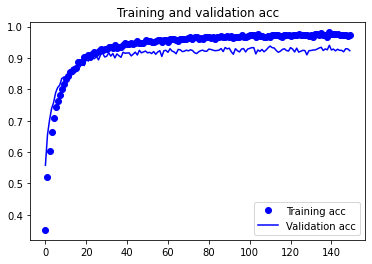

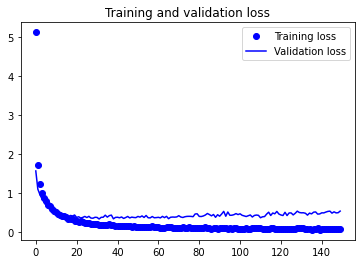

In [30]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.figure()

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation acc')
plt.legend()
plt.show()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

### Test the model 

Here we will review the accuracy of the model on both the training and test data sets. 

In [31]:
# Evaluating the model on the training and testing set
score = model.evaluate(x_train, y_train, verbose=0)
print("Training Accuracy: ", score[1])

score = model.evaluate(x_test, y_test, verbose=0)
print("Testing Accuracy: ", score[1])

Training Accuracy:  0.9939836859703064
Testing Accuracy:  0.9232531785964966


### Predictions  

Here we will build a method which will allow us to test the models predictions on a specified audio .wav file. 

In [32]:
def extract_feature(file_name):
   
    try:
        audio_data, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
        mfccs = librosa.feature.mfcc(y=audio_data, sr=sample_rate, n_mfcc=40)
        mfccsscaled = np.mean(mfccs.T,axis=0)
        
    except Exception as e:
        print("Error encountered while parsing file: ", file)
        return None, None

    return np.array([mfccsscaled])

def print_prediction(file_name):
    prediction_feature = extract_feature(file_name) 
    #print(prediction_feature)
    predicted_vector = model.predict_classes(prediction_feature)
    predicted_class = le.inverse_transform(predicted_vector) 
    print("The predicted class is:", predicted_class[0], '\n') 

    predicted_proba_vector = model.predict_proba(prediction_feature) 
    predicted_proba = predicted_proba_vector[0]
    for i in range(len(predicted_proba)): 
        category = le.inverse_transform(np.array([i]))
        print(category[0], "\t\t : ", format(predicted_proba[i], '.32f') )

### Validation 

#### Test with sample data 

Initial sainity check to verify the predictions using a subsection of the sample audio files we explored in the first notebook. We expect the bulk of these to be classified correctly. 

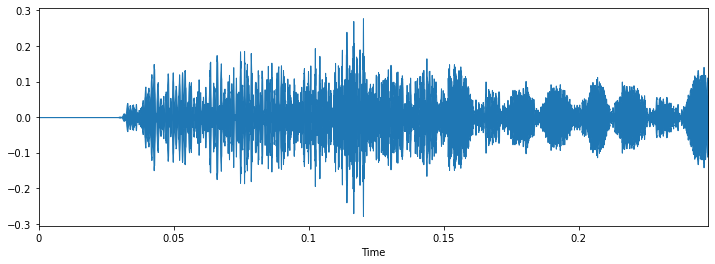

In [33]:
filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/eval_data/4201-3-0-0.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

In [34]:
print_prediction(filename) 

The predicted class is: dog_bark 

air_conditioner 		 :  0.00000000388270349205299680761527
car_horn 		 :  0.00000000000000188782425767654825
children_playing 		 :  0.00007565881969640031456947326660
dog_bark 		 :  0.64003741741180419921875000000000
drilling 		 :  0.00000000568543656598308189131785
engine_idling 		 :  0.11416664719581604003906250000000
gun_shot 		 :  0.24570779502391815185546875000000
jackhammer 		 :  0.00000000000000000061620307914134
siren 		 :  0.00001237463766301516443490982056
street_music 		 :  0.00000004331520386813281220383942


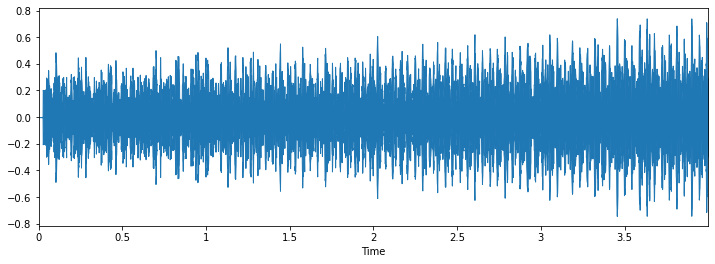

In [35]:
filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/eval_data/6988-5-0-0.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

In [36]:
print_prediction(filename) 

The predicted class is: engine_idling 

air_conditioner 		 :  0.00000000000000000004665756512193
car_horn 		 :  0.00000000000000000401037137377501
children_playing 		 :  0.00000007154098113915097201243043
dog_bark 		 :  0.00000000000356488211346317473982
drilling 		 :  0.00000000000000003764739511850959
engine_idling 		 :  0.99999988079071044921875000000000
gun_shot 		 :  0.00000000000000000036329899165360
jackhammer 		 :  0.00000000000000000000000000000000
siren 		 :  0.00000000000002250953804318160667
street_music 		 :  0.00000000000000003426291615907743


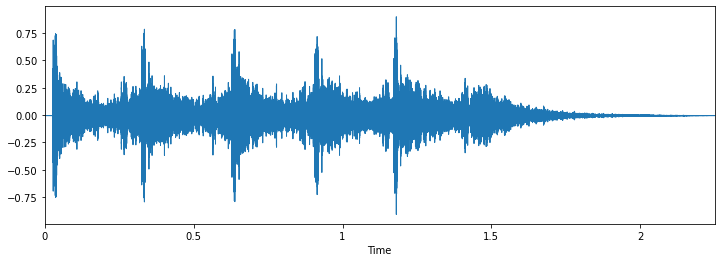

In [37]:
filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/eval_data/7061-6-0-0.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

In [38]:
print_prediction(filename) 

The predicted class is: dog_bark 

air_conditioner 		 :  0.00000000000000000004047835146275
car_horn 		 :  0.00000000000000000000000036569188
children_playing 		 :  0.00000007696711179505655309185386
dog_bark 		 :  0.76830393075942993164062500000000
drilling 		 :  0.00022144598187878727912902832031
engine_idling 		 :  0.00000000000000012717052238077586
gun_shot 		 :  0.00000000000000011596070306835524
jackhammer 		 :  0.00000000000000000415784402851311
siren 		 :  0.23147450387477874755859375000000
street_music 		 :  0.00000000009309436554971739496978


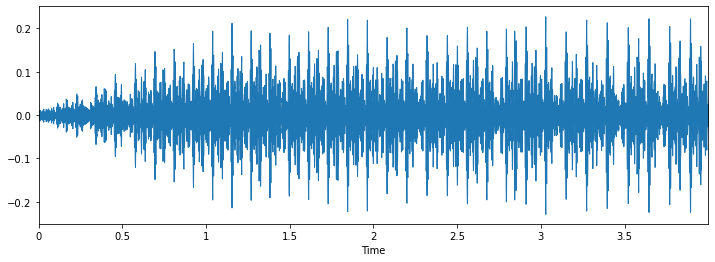

In [39]:
filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/eval_data/81068-5-0-0.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

In [40]:
print_prediction(filename) 

The predicted class is: engine_idling 

air_conditioner 		 :  0.00105978932697325944900512695312
car_horn 		 :  0.00000000002572301399661469645253
children_playing 		 :  0.00000001519918413350751507095993
dog_bark 		 :  0.00005343593875295482575893402100
drilling 		 :  0.00000000334483440944666199357016
engine_idling 		 :  0.99881196022033691406250000000000
gun_shot 		 :  0.00000002494662254548529745079577
jackhammer 		 :  0.00000000762675611554186616558582
siren 		 :  0.00000000010269119582462238327025
street_music 		 :  0.00007481675129383802413940429688


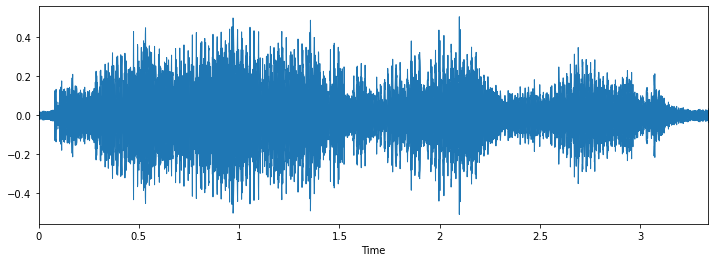

In [41]:
filename = '/Users/Manuel/MASTER/IMMUNE/8 DeepLearning/UrbanSound8K/eval_data/205874-4-7-0.wav'
plt.figure(figsize=(12,4))
data,sample_rate = librosa.load(filename)
_ = librosa.display.waveplot(data,sr=sample_rate)
ipd.Audio(filename)

In [42]:
print_prediction(filename) 

The predicted class is: drilling 

air_conditioner 		 :  0.00000000000000000004481449039489
car_horn 		 :  0.00000000000000054967281963737681
children_playing 		 :  0.00000000000008893179161834074975
dog_bark 		 :  0.00000000000001933871594491428508
drilling 		 :  0.99999856948852539062500000000000
engine_idling 		 :  0.00000000000000652292449384011402
gun_shot 		 :  0.00000000000000009835411079060484
jackhammer 		 :  0.00000140399185966089135035872459
siren 		 :  0.00000000000000000000869345417264
street_music 		 :  0.00000000000000072221433096558425
